# Deep Learning for Computer Vision:  Final Project

## Computer Science: COMS W 4995 006

#### Author: Carmem Domingues

### Problem: Distinguishing between underwater ocean images containing plastic and not

Plastic Pollution in our waterways (rivers, lakes, oceans, etc.) is a huge environmental problem in today's world. It is predicted that by 2050 there will be more plastic (by weight) than fish in the ocean. 

I would like to use Deep Learning and Computer Vision to help solve this problem. The applications of this are many, but we start with the simple problem of using DL and CV to distinguish between underwater ocean images that contain pieces of plastic, and those that do not (and only contain normal marine life). 

Data was collected manually via Google Searches. More information on the data collection process can be found on the Final Presentation and Final Report for this project.

For the analysis:

1. Start with a simple ConvNet, to help us distinguish between plastic and no-plastic images
2. Use a ConvNet (VGG16) that was pre-trained on ImageNet to see how we do
3. Modify the top layers for the binary case, freeze all layers up to the top, and retrain just the top ones 
4. Unfreeze all layers and continue fine tuning
5. Try ResNet, using similar process as steps 3-4
6. If time allows, we move on to object detection within the images, to try and identify which parts of the images are plastic vs. normal marine life

Note: Steps 1-4 are inspired and leverage code from homework 5.

In [1]:
import os
import h5py

import matplotlib.pyplot as plt
import time, pickle, pandas

import numpy as np

from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential, load_model
from keras.layers import Convolution2D, MaxPooling2D, ZeroPadding2D, Conv2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras.callbacks import TensorBoard, ModelCheckpoint
from keras import backend
from keras import optimizers

%matplotlib inline

/usr/local/lib/python3.5/dist-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

Setup some basics for the models:

In [3]:
nb_classes = 2
class_name = {
    0: 'noplastic',
    1: 'plastic',
}

In [4]:
# dimensions of our images.
img_width, img_height = 150, 150

train_data_dir = '../Images/data_for_modeling/train'
validation_data_dir = '../Images/data_for_modeling/validation'
nb_train_samples = 900+700
nb_validation_samples = 77+70
batch_size = 32
steps_per_epoch_train = nb_train_samples / batch_size
steps_per_epoch_val = nb_validation_samples / batch_size

Use the code from homework 5 for showing the images:

In [5]:
def show_sample(X, y, prediction=-1):
    im = X
    plt.imshow(im)
    if prediction >= 0:
        plt.title("Class = %s, Predict = %s" % (class_name[y], class_name[prediction]))
    else:
        plt.title("Class = %s" % (class_name[y]))

    plt.axis('on')
    plt.show()

In [6]:
# this is the augmentation configuration we will use for training
train_datagen = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True)

# this is the augmentation configuration we will use for testing:
# only rescaling
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_width, img_height),
        batch_size=32,
        class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
        validation_data_dir,
        target_size=(img_width, img_height),
        batch_size=32,
        class_mode='binary')

Found 1586 images belonging to 2 classes.
Found 147 images belonging to 2 classes.


In [7]:
nb_train_samples, nb_validation_samples

(1600, 147)

##### Looks like images were "lost" for some reason -> from 1600 training images, it only picked up 1587

Show some sample images from the dataset - borrow code from homework 5

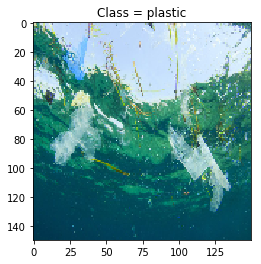

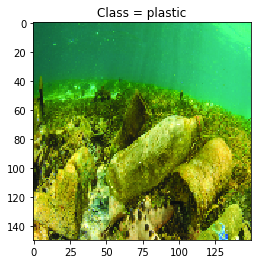

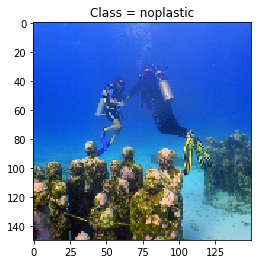

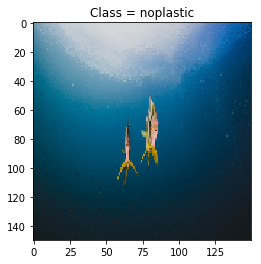

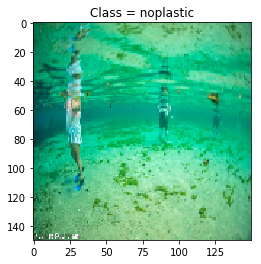

...

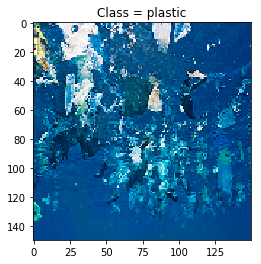

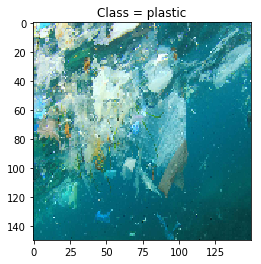

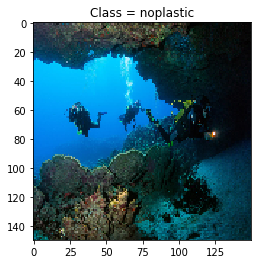

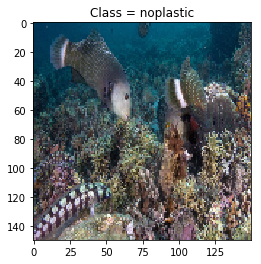

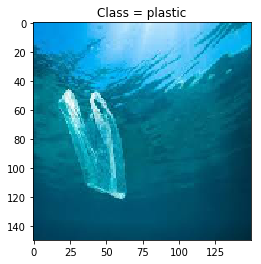

In [8]:
for X_batch, Y_batch in validation_generator:
    for i in range(len(Y_batch)):
        show_sample(X_batch[i, :, :, :], Y_batch[i])
    break

## 1. Simple ConvNet (from homework 5) 

In [9]:
model_scn = Sequential()
model_scn.add(Conv2D(32, (3, 3), input_shape=(img_width, img_height, 3)))
model_scn.add(Activation('relu'))
model_scn.add(MaxPooling2D(pool_size=(2, 2)))

model_scn.add(Conv2D(32, (3, 3)))
model_scn.add(Activation('relu'))
model_scn.add(MaxPooling2D(pool_size=(2, 2)))

model_scn.add(Conv2D(63, (3, 3)))
model_scn.add(Activation('relu'))
model_scn.add(MaxPooling2D(pool_size=(2, 2)))

model_scn.add(Flatten())
model_scn.add(Dense(64))
model_scn.add(Activation('relu'))
model_scn.add(Dropout(0.5))
model_scn.add(Dense(1))
model_scn.add(Activation('sigmoid'))

In [10]:
model_scn.compile(loss = 'binary_crossentropy',
              optimizer = 'rmsprop',
              metrics=['accuracy'])

print(model_scn.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
activation_1 (Activation)    (None, 148, 148, 32)      0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 72, 72, 32)        9248      
_________________________________________________________________
activation_2 (Activation)    (None, 72, 72, 32)        0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 36, 36, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 34, 34, 63)        18207     
__________

In [11]:
%pushd
%mkdir -p history
%mkdir -p models
%mkdir -p logs
%cd logs 
%mkdir -p ./scn
%mkdir -p ./vgg16_fine_tuning
%popd

/home/cd2821/final_project/dl_4_cv/logs
/home/cd2821/final_project/dl_4_cv
popd -> ~/final_project/dl_4_cv


In [12]:
tensorboard_callback_scn = TensorBoard(log_dir='./logs/scn/', 
                                       histogram_freq=0, write_graph=True, write_images=False)
checkpoint_callback_scn = ModelCheckpoint('./models/scn_weights.{epoch:02d}-{val_acc:.2f}.hdf5', 
                                          monitor='val_acc', verbose=0, save_best_only=True, 
                                          save_weights_only=False, mode='auto', period=1)

Instructions for updating:
Use the retry module or similar alternatives.


Train the model

In [13]:
%%time
nb_epoch_scn = 10

hist_scn = model_scn.fit_generator(train_generator, 
              initial_epoch=0, 
              verbose=1, 
              validation_data=validation_generator, 
              steps_per_epoch=steps_per_epoch_train, 
              epochs=nb_epoch_scn, 
              callbacks=[tensorboard_callback_scn, checkpoint_callback_scn],
              validation_steps=steps_per_epoch_val)
                                                                                                                                   
pandas.DataFrame(hist_scn.history).to_csv("./history/scn.csv")

Epoch 1/10
50/50 [==============================] - 49s 988ms/step - loss: 0.6952 - acc: 0.6382 - val_loss: 0.6725 - val_acc: 0.6735
Epoch 2/10
50/50 [==============================] - 46s 916ms/step - loss: 0.6017 - acc: 0.6919 - val_loss: 0.6565 - val_acc: 0.6599
Epoch 3/10
50/50 [==============================] - 46s 915ms/step - loss: 0.5937 - acc: 0.6982 - val_loss: 0.6613 - val_acc: 0.6871
Epoch 4/10
50/50 [==============================] - 46s 919ms/step - loss: 0.5673 - acc: 0.7188 - val_loss: 1.2161 - val_acc: 0.6667
Epoch 5/10
50/50 [==============================] - 45s 909ms/step - loss: 0.5557 - acc: 0.7173 - val_loss: 0.5537 - val_acc: 0.6939
Epoch 6/10
50/50 [==============================] - 45s 906ms/step - loss: 0.5372 - acc: 0.7360 - val_loss: 0.6488 - val_acc: 0.6803
Epoch 7/10
50/50 [==============================] - 45s 906ms/step - loss: 0.5229 - acc: 0.7457 - val_loss: 0.5849 - val_acc: 0.6871
Epoch 8/10
50/50 [==============================] - 45s 905ms/step - 

Grab some validation batches and evaluate our accuracy:

In [14]:
accuracies_scn = np.array([])
losses_scn = np.array([])

i=0
for X_batch, Y_batch in validation_generator:
    loss, accuracy = model_scn.evaluate(X_batch, Y_batch, verbose=0)
    losses_scn = np.append(losses_scn, loss)
    accuracies_scn = np.append(accuracies_scn, accuracy)
    i += 1
    if i == 20:
       break
       
print("Validation: accuracy = %f  ;  loss = %f" % (np.mean(accuracies_scn), np.mean(losses_scn)))

Validation: accuracy = 0.706743  ;  loss = 0.502804


In [15]:
X_test, y_test = next(validation_generator)
predictions_scn = model_scn.predict_classes(X_test, batch_size=32, verbose=0)

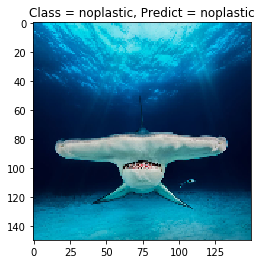

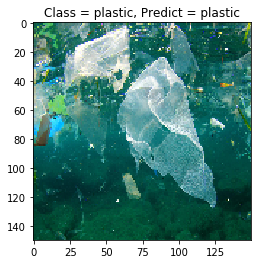

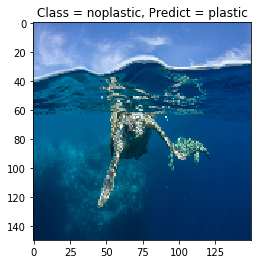

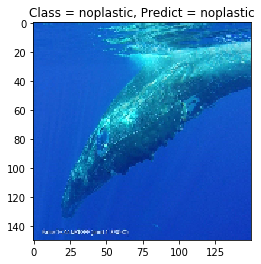

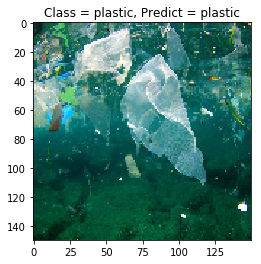

...

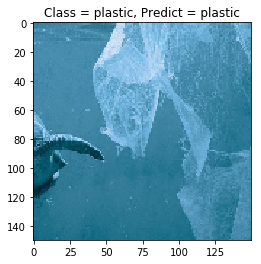

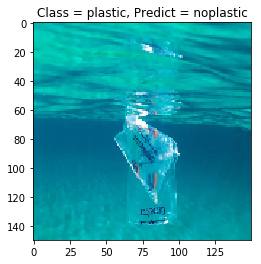

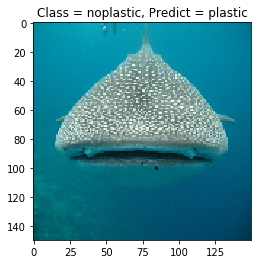

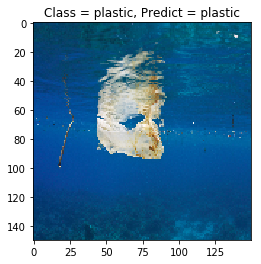

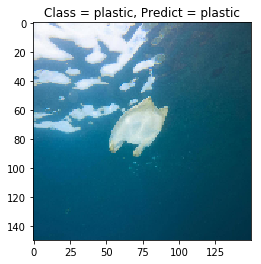

In [16]:
for i in range(32):
    show_sample(X_test[i, :, :, :], y_test[i], prediction=predictions_scn[i, 0])

Most of the mis-predictions were true label "plastic", but predicted "no plastic" -> seems like there is a bias in the model

Accuracy in this initial model was 70.7% - considerable, given the small dataset size (compare to the 10k of each cat/dog label in the cat/dog exercise we did).

However, we can likely do better by the following models.

## 2. Use a ConvNet (VGG16) that was pre-trained on ImageNet to see how we do

Let's try to build a more powerful ConvNet: VGG16. We will not train it from scratch but rather load in the weights for the model from a pre-trained version, version that was trained on ImageNet. We will then chop of the last layer and replace it with one that fits our two class plastic vs. no plastic problem. 

We will freeze the bottom layers of the network and only train the weights of the new last layers. Why? Because if we allow the whole model to train all the weights at once we might do damage to the carefully selected weights in the lower convolutional layers. So instead, we train only the top layer. 

This training produces a classifier that has 91% accuracy, which is quite an improvement over the last one. However, once this training converges, more or less, we then unfreeze the lower layers and let all the layers train. The final model gets 97% accuracy!

The routine below make a VGG16 network in either Theano or Tensorflow style. The only difference is the ordering of the volume indices. Note that it does not make the last layers as these would have to be removed.

In [17]:
def build_vgg16(framework='tf'):

    if framework == 'th':
        # build the VGG16 network in Theano weight ordering mode
        backend.set_image_dim_ordering('th')
    else:
        # build the VGG16 network in Tensorflow weight ordering mode
        backend.set_image_dim_ordering('tf')
        
    model = Sequential()
    if framework == 'th':
        model.add(ZeroPadding2D((1, 1), input_shape=(3, img_width, img_height)))
    else:
        model.add(ZeroPadding2D((1, 1), input_shape=(img_width, img_height, 3)))
        
    model.add(Conv2D(64, (3, 3), activation='relu', name='conv1_1'))
    model.add(ZeroPadding2D((1, 1)))
    model.add(Conv2D(64, (3, 3), activation='relu', name='conv1_2'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))

    model.add(ZeroPadding2D((1, 1)))
    model.add(Conv2D(128, (3, 3), activation='relu', name='conv2_1'))
    model.add(ZeroPadding2D((1, 1)))
    model.add(Conv2D(128, (3, 3), activation='relu', name='conv2_2'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))

    model.add(ZeroPadding2D((1, 1)))
    model.add(Conv2D(256, (3, 3), activation='relu', name='conv3_1'))
    model.add(ZeroPadding2D((1, 1)))
    model.add(Conv2D(256, (3, 3), activation='relu', name='conv3_2'))
    model.add(ZeroPadding2D((1, 1)))
    model.add(Conv2D(256, (3, 3), activation='relu', name='conv3_3'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))

    model.add(ZeroPadding2D((1, 1)))
    model.add(Conv2D(512, (3, 3), activation='relu', name='conv4_1'))
    model.add(ZeroPadding2D((1, 1)))
    model.add(Conv2D(512, (3, 3), activation='relu', name='conv4_2'))
    model.add(ZeroPadding2D((1, 1)))
    model.add(Conv2D(512, (3, 3), activation='relu', name='conv4_3'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))

    model.add(ZeroPadding2D((1, 1)))
    model.add(Conv2D(512, (3, 3), activation='relu', name='conv5_1'))
    model.add(ZeroPadding2D((1, 1)))
    model.add(Conv2D(512, (3, 3), activation='relu', name='conv5_2'))
    model.add(ZeroPadding2D((1, 1)))
    model.add(Conv2D(512, (3, 3), activation='relu', name='conv5_3'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))
    
    return model

In [18]:
# path to the model weights files.
weights_path = './weights/vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5'
# Pulled weights from (googled for them): https://github.com/MinerKasch/applied_deep_learning/blob
    # /master/vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5
tf_model = build_vgg16('tf')
tf_model.load_weights(weights_path)

In [19]:
tf_model

In [20]:
# build a classifier model to put on top of the convolutional model
top_model = Sequential()
# print(Flatten(input_shape=tf_model.output_shape[1:]))
top_model.add(Flatten(input_shape=tf_model.output_shape[1:]))
top_model.add(Dense(256, activation='relu'))
top_model.add(Dropout(0.5))
top_model.add(Dense(1, activation='sigmoid'))
print(tf_model.summary())
print(top_model.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
zero_padding2d_1 (ZeroPaddin (None, 152, 152, 3)       0         
_________________________________________________________________
conv1_1 (Conv2D)             (None, 150, 150, 64)      1792      
_________________________________________________________________
zero_padding2d_2 (ZeroPaddin (None, 152, 152, 64)      0         
_________________________________________________________________
conv1_2 (Conv2D)             (None, 150, 150, 64)      36928     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 75, 75, 64)        0         
_________________________________________________________________
zero_padding2d_3 (ZeroPaddin (None, 77, 77, 64)        0         
_________________________________________________________________
conv2_1 (Conv2D)             (None, 75, 75, 128)       73856     
__________

We add this model to the top of our VGG16 network, freeze all the weights except the top, and compile.

In [21]:
# add the model on top of the convolutional base
tf_model.add(top_model)

In [22]:
# set the first 25 layers (up to the last conv block)
# to non-trainable (weights will not be updated)
for layer in tf_model.layers[:25]:
    layer.trainable = False

# compile the model with a SGD/momentum optimizer
# and a very slow learning rate.
tf_model.compile(loss='binary_crossentropy',
              optimizer=optimizers.SGD(lr=1e-4, momentum=0.9),
              metrics=['accuracy'])

In [23]:
tf_model.layers[0].trainable

False

## 3. Train top model with frozen layers

Now we train for 5 epochs to get the weights for the top close to where we need them. Essentially, we want the network to be doing the right thing before we unnfreeze the lower weights.

In [24]:
tensorboard_callback_tt = TensorBoard(log_dir='./logs/train_top/', histogram_freq=0, write_graph=True, 
                                   write_images=False)
checkpoint_callback_tt = ModelCheckpoint('./models/train_top_weights.{epoch:02d}-{val_acc:.2f}.hdf5', 
                                      monitor='val_acc', verbose=0, save_best_only=True, save_weights_only=False, 
                                      mode='auto', period=1)

In [25]:
%%time
nb_epoch = 10

hist_train_top = tf_model.fit_generator(train_generator, 
              initial_epoch=0, 
              verbose=1, 
              validation_data=validation_generator, 
              steps_per_epoch=steps_per_epoch_train, 
              epochs=nb_epoch, 
              callbacks=[tensorboard_callback_tt, checkpoint_callback_tt],
              validation_steps=steps_per_epoch_val)
                                                                                                                                   
pandas.DataFrame(hist_train_top.history).to_csv("./history/train_top.csv")

Epoch 1/10
50/50 [==============================] - 50s 1s/step - loss: 0.7186 - acc: 0.5625 - val_loss: 0.6541 - val_acc: 0.6599
Epoch 2/10
50/50 [==============================] - 44s 885ms/step - loss: 0.6229 - acc: 0.6569 - val_loss: 0.5981 - val_acc: 0.7075
Epoch 3/10
50/50 [==============================] - 46s 912ms/step - loss: 0.5684 - acc: 0.7132 - val_loss: 0.5576 - val_acc: 0.7347
Epoch 4/10
50/50 [==============================] - 45s 903ms/step - loss: 0.5418 - acc: 0.7407 - val_loss: 0.5253 - val_acc: 0.7619
Epoch 5/10
50/50 [==============================] - 45s 907ms/step - loss: 0.5178 - acc: 0.7410 - val_loss: 0.4978 - val_acc: 0.7619
Epoch 6/10
50/50 [==============================] - 45s 905ms/step - loss: 0.4798 - acc: 0.7803 - val_loss: 0.5051 - val_acc: 0.7483
Epoch 7/10
50/50 [==============================] - 45s 910ms/step - loss: 0.4562 - acc: 0.7904 - val_loss: 0.4655 - val_acc: 0.7755
Epoch 8/10
50/50 [==============================] - 46s 911ms/step - los

In [26]:
accuracies_train_top = np.array([])
losses_train_top = np.array([])

i=0
for X_batch, Y_batch in validation_generator:
    loss, accuracy = tf_model.evaluate(X_batch, Y_batch, verbose=0)
    losses_train_top = np.append(losses_train_top, loss)
    accuracies_train_top = np.append(accuracies_train_top, accuracy)
    i += 1
    if i == 20:
       break
       
print("Validation train top: accuracy = %f  ;  loss = %f" % (np.mean(accuracies_train_top), 
                                                             np.mean(losses_train_top)))

Validation train top: accuracy = 0.841941  ;  loss = 0.413452


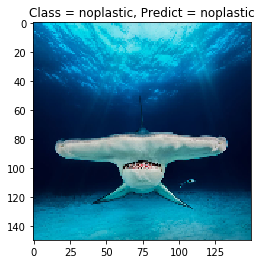

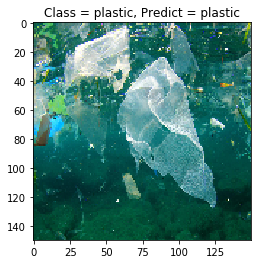

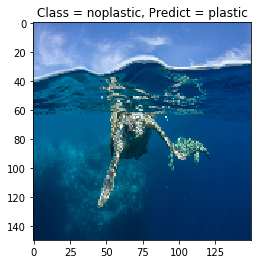

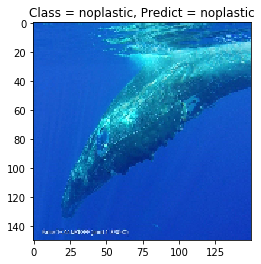

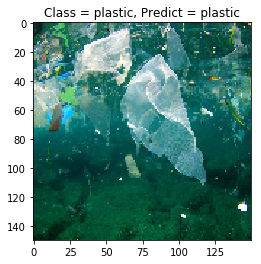

...

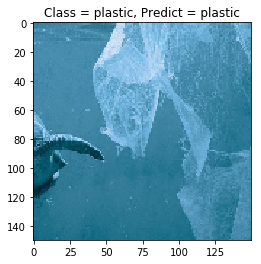

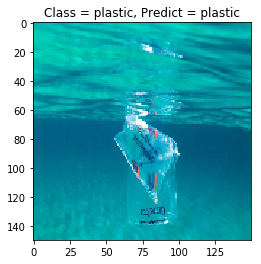

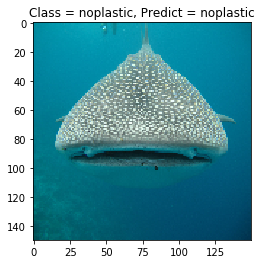

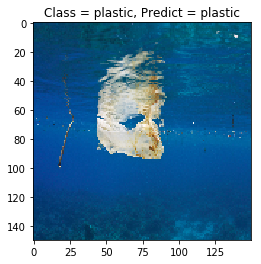

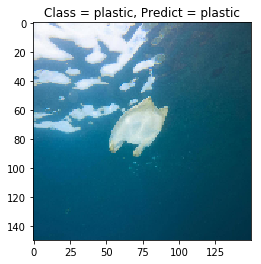

In [27]:
predictions_train_top = tf_model.predict_classes(X_test, batch_size=32, verbose=0)
for i in range(32):
    show_sample(X_test[i, :, :, :], y_test[i], prediction=predictions_train_top[i, 0])

## 4. Unfreeze all layers 

Unfreeze the lower layers

In [28]:
# set the first 25 layers (up to the last conv block)
# to trainable (weights will be updated)
for layer in tf_model.layers[:25]:
    layer.trainable = True

# compile the model with a SGD/momentum optimizer
# and a very slow learning rate.
tf_model.compile(loss='binary_crossentropy',
              optimizer=optimizers.SGD(lr=1e-4, momentum=0.9),
              metrics=['accuracy'])

In [29]:
tf_model.layers[0].trainable

True

Train model

In [30]:
tensorboard_callback_tt_unfreeze = TensorBoard(log_dir='./logs/train_top_unfreeze/', histogram_freq=0, 
                                               write_graph=True, write_images=False)
checkpoint_callback_tt_unfreeze = ModelCheckpoint(
                                './models/train_top_unfreeze_weights.{epoch:02d}-{val_acc:.2f}.hdf5', 
                                monitor='val_acc', verbose=0, save_best_only=True, 
                                save_weights_only=False, mode='auto', period=1)

nb_epoch_tt_unfreeze = 10

hist_train_top_unfreeze = tf_model.fit_generator(train_generator, 
              initial_epoch=0, 
              verbose=1, 
              validation_data=validation_generator, 
              steps_per_epoch=steps_per_epoch_train, 
              epochs=nb_epoch_tt_unfreeze, 
              callbacks=[tensorboard_callback_tt_unfreeze, checkpoint_callback_tt_unfreeze],
              validation_steps=steps_per_epoch_val)
                                                                                                                                   
pandas.DataFrame(hist_train_top_unfreeze.history).to_csv("./history/train_top_unfreeze.csv")

Epoch 1/10
50/50 [==============================] - 50s 999ms/step - loss: 0.3823 - acc: 0.8298 - val_loss: 0.4053 - val_acc: 0.8163
Epoch 2/10
50/50 [==============================] - 46s 912ms/step - loss: 0.3753 - acc: 0.8435 - val_loss: 0.3441 - val_acc: 0.8571
Epoch 3/10
50/50 [==============================] - 46s 918ms/step - loss: 0.3389 - acc: 0.8467 - val_loss: 0.3309 - val_acc: 0.8503
Epoch 4/10
50/50 [==============================] - 46s 914ms/step - loss: 0.3406 - acc: 0.8523 - val_loss: 0.3521 - val_acc: 0.8435
Epoch 5/10
50/50 [==============================] - 45s 908ms/step - loss: 0.2904 - acc: 0.8873 - val_loss: 0.3051 - val_acc: 0.8571
Epoch 6/10
50/50 [==============================] - 46s 916ms/step - loss: 0.2675 - acc: 0.8970 - val_loss: 0.2753 - val_acc: 0.8844
Epoch 7/10
50/50 [==============================] - 46s 917ms/step - loss: 0.2462 - acc: 0.8978 - val_loss: 0.2799 - val_acc: 0.8776
Epoch 8/10
50/50 [==============================] - 46s 914ms/step - 

In [31]:
accuracies_train_top_unfreeze = np.array([])
losses_train_top_unfreeze = np.array([])

i=0
for X_batch, Y_batch in validation_generator:
    loss, accuracy = tf_model.evaluate(X_batch, Y_batch, verbose=0)
    losses_train_top_unfreeze = np.append(losses_train_top_unfreeze, loss)
    accuracies_train_top_unfreeze = np.append(accuracies_train_top_unfreeze, accuracy)
    i += 1
    if i == 20:
       break
       
print("Validation train top: accuracy = %f  ;  loss = %f" % (np.mean(accuracies_train_top_unfreeze), 
                                                             np.mean(losses_train_top_unfreeze)))

Validation train top: accuracy = 0.880921  ;  loss = 0.264077


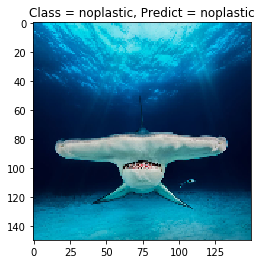

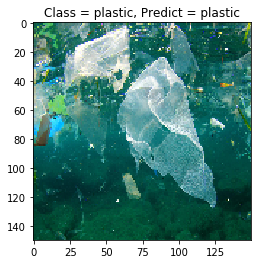

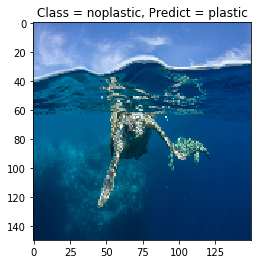

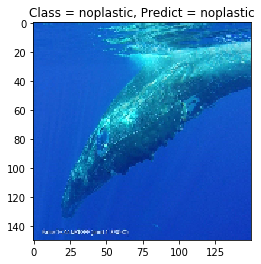

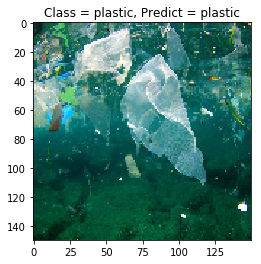

...

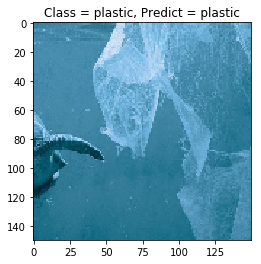

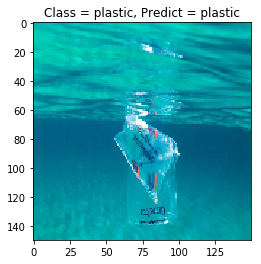

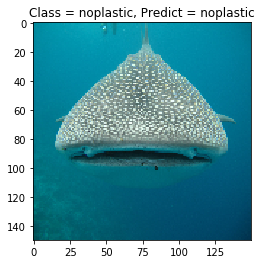

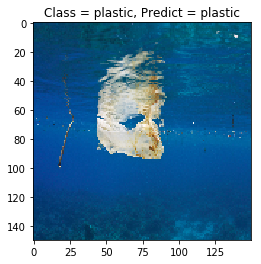

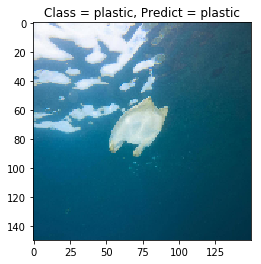

In [32]:
predictions_train_top_unfreeze = tf_model.predict_classes(X_test, batch_size=32, verbose=0)
for i in range(32):
    show_sample(X_test[i, :, :, :], y_test[i], prediction=predictions_train_top_unfreeze[i, 0])

We let it go one last time and see that it pushes up just a bit higher over 91%. Also note that it looks like it is beginning to overfit as the training loss is coming way down and the training accuracy is going well beyond the validation accuracy.

In [36]:
tensorboard_callback_tt_unfreeze_plus = TensorBoard(log_dir='./logs/train_top_unfreeze_plus/', histogram_freq=0, 
                                               write_graph=True, write_images=False)
checkpoint_callback_tt_unfreeze_plus = ModelCheckpoint(
                                './models/train_top_unfreeze_plus_weights.{epoch:02d}-{val_acc:.2f}.hdf5', 
                                monitor='val_acc', verbose=0, save_best_only=True, 
                                save_weights_only=False, mode='auto', period=1)

nb_epoch_tt_unfreeze_plus = 5

hist_train_top_unfreeze_plus = tf_model.fit_generator(train_generator, 
              initial_epoch=0, 
              verbose=1, 
              validation_data=validation_generator, 
              steps_per_epoch=steps_per_epoch_train, 
              epochs=nb_epoch_tt_unfreeze_plus, 
              callbacks=[tensorboard_callback_tt_unfreeze_plus, checkpoint_callback_tt_unfreeze_plus],
              validation_steps=steps_per_epoch_val)
                                                                                                                                   
pandas.DataFrame(hist_train_top_unfreeze_plus.history).to_csv("./history/train_top_unfreeze_plus.csv")

Epoch 1/5
50/50 [==============================] - 50s 999ms/step - loss: 0.1588 - acc: 0.9375 - val_loss: 0.3899 - val_acc: 0.8639
Epoch 2/5
50/50 [==============================] - 46s 915ms/step - loss: 0.1541 - acc: 0.9320 - val_loss: 0.2593 - val_acc: 0.8844
Epoch 3/5
50/50 [==============================] - 46s 915ms/step - loss: 0.1570 - acc: 0.9433 - val_loss: 0.3700 - val_acc: 0.8776
Epoch 4/5
50/50 [==============================] - 46s 916ms/step - loss: 0.1472 - acc: 0.9417 - val_loss: 0.2193 - val_acc: 0.9048
Epoch 5/5
50/50 [==============================] - 46s 918ms/step - loss: 0.1182 - acc: 0.9520 - val_loss: 0.2719 - val_acc: 0.9048


In [37]:
accuracies_train_top_unfreeze_plus = np.array([])
losses_train_top_unfreeze_plus = np.array([])

i=0
for X_batch, Y_batch in validation_generator:
    loss, accuracy = tf_model.evaluate(X_batch, Y_batch, verbose=0)
    losses_train_top_unfreeze_plus = np.append(losses_train_top_unfreeze_plus, loss)
    accuracies_train_top_unfreeze_plus = np.append(accuracies_train_top_unfreeze_plus, accuracy)
    i += 1
    if i == 20:
       break
       
print("Validation train top: accuracy = %f  ;  loss = %f" % (np.mean(accuracies_train_top_unfreeze_plus), 
                                                             np.mean(losses_train_top_unfreeze_plus)))

Validation train top: accuracy = 0.905592  ;  loss = 0.277410


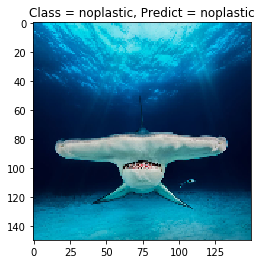

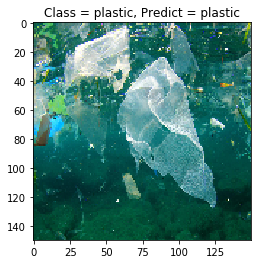

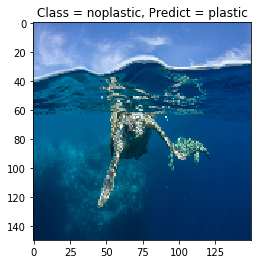

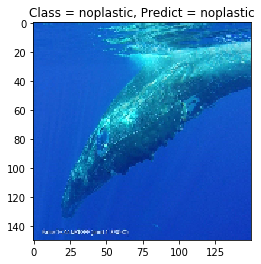

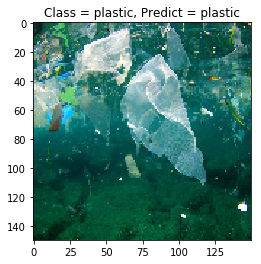

...

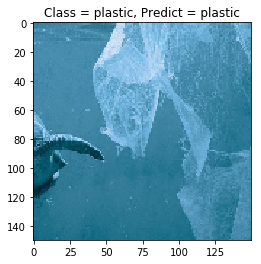

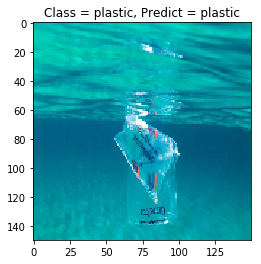

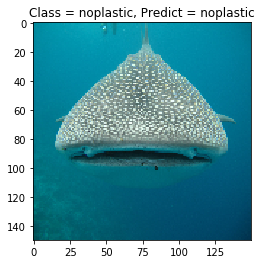

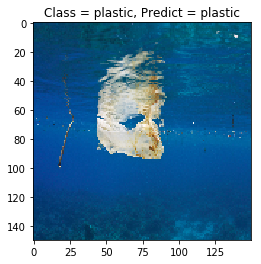

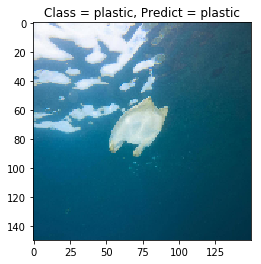

In [38]:
predictions_train_top_unfreeze_plus = tf_model.predict_classes(X_test, batch_size=32, verbose=0)
for i in range(32):
    show_sample(X_test[i, :, :, :], y_test[i], prediction=predictions_train_top_unfreeze_plus[i, 0])

90% accuracy! =) - not bad! 

## 4. Let's see if we can do better with ResNet! 

## 5. Let's move on to Object Detection 